# PMR3508 - Adults dataset
## Modelos que serão utilizados:

* ###   LDA
* ###   SUPPORT VECTOR MACHINES
* ###   RANDOM FOREST
* ###   REDE NEURAL

## 🎈Cabeçalho

**NOME:** Narayan Shimanoe Lisboa  

**Nusp:** 14600141  

**HASH:** 32

## ⏳ Loading do dados

In [121]:
import pandas as pd

train = pd.read_csv("/kaggle/input/adult-pmr3508/train_data.csv",
        sep=r'\s*,\s*',
        engine='python',
        na_values="?")

In [122]:
train.shape

(32560, 16)

In [123]:
train.head()

,Id,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,16280,34,Private,204991,Some-college,10,Divorced,Exec-managerial,Own-child,White,Male,0,0,44,United-States,<=50K
1,16281,58,Local-gov,310085,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K
2,16282,25,Private,146117,Some-college,10,Never-married,Machine-op-inspct,Not-in-family,White,Male,0,0,42,United-States,<=50K
3,16283,24,Private,138938,Some-college,10,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
4,16284,57,Self-emp-inc,258883,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,5178,0,60,Hungary,>50K


In [124]:
train.info

<bound method DataFrame.info of           Id  age     workclass  fnlwgt     education  education.num  \
0      16280   34       Private  204991  Some-college             10   
1      16281   58     Local-gov  310085          10th              6   
2      16282   25       Private  146117  Some-college             10   
3      16283   24       Private  138938  Some-college             10   
4      16284   57  Self-emp-inc  258883       HS-grad              9   
...      ...  ...           ...     ...           ...            ...   
32555  48835   42       Private  384236       Masters             14   
32556  48836   23       Private  129042       HS-grad              9   
32557  48837   30       Private  195488       HS-grad              9   
32558  48838   18       Private   27620       HS-grad              9   
32559  48839   47     Local-gov  203067     Bachelors             13   

           marital.status         occupation   relationship   race     sex  \
0                Divorced

# 1️⃣ 🎲 Análise de dados

### A escolha do uso dos dados para teste serão iguais ao utilizados no [EP1][1] .  
### Sendo assim, serão apenas usados as labels: age, workclass, education, education.num, sex, capital gain, capital loss, hours per week.
[1]:https://www.kaggle.com/code/pmr3508202432/pmr3508-2024-32-adult-knn#Prepara%C3%A7%C3%A3o-dos-dados-de-treinamento

## Dados quantitativos:  
As labels "age", "education.num", "capital gain", "capital loss" e "hours per week" serão normalizados.  
## Dados qualitativos: 
Os dados serão transformados em 1 e 0, a partir das análises feitas no [EP1][1]  

[1]:https://www.kaggle.com/code/pmr3508202432/pmr3508-2024-32-adult-knn

## 🚅 Tratamento dos dados

In [125]:
# Remoção dos dados faltantes
train = train.dropna()
# Salver os Id`s
train_ids = train['Id']
# Remoção das colunas que não serão utilizadas
train = train.drop(['Id','fnlwgt' ,'relationship','native.country','race', 'marital.status', 'occupation'], axis=1)
train.head()

,age,workclass,education,education.num,sex,capital.gain,capital.loss,hours.per.week,income
0,34,Private,Some-college,10,Male,0,0,44,<=50K
1,58,Local-gov,10th,6,Male,0,0,40,<=50K
2,25,Private,Some-college,10,Male,0,0,42,<=50K
3,24,Private,Some-college,10,Female,0,0,40,<=50K
4,57,Self-emp-inc,HS-grad,9,Male,5178,0,60,>50K


### Preparação dos dados quatitativos

In [126]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Selecionar apenas colunas quantitativas (numéricas)
quantitative_data = train.select_dtypes(include=['number'])

# Normalizar os dados quantitativos
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(quantitative_data)

# Substituir no DataFrame original
train[quantitative_data.columns] = normalized_data

print(train)

            age     workclass     education  education.num     sex  \
0      0.232877       Private  Some-college       0.600000    Male   
1      0.561644     Local-gov          10th       0.333333    Male   
2      0.109589       Private  Some-college       0.600000    Male   
3      0.095890       Private  Some-college       0.600000  Female   
4      0.547945  Self-emp-inc       HS-grad       0.533333    Male   
...         ...           ...           ...            ...     ...   
32555  0.342466       Private       Masters       0.866667    Male   
32556  0.082192       Private       HS-grad       0.533333  Female   
32557  0.178082       Private       HS-grad       0.533333  Female   
32558  0.013699       Private       HS-grad       0.533333  Female   
32559  0.410959     Local-gov     Bachelors       0.800000    Male   

       capital.gain  capital.loss  hours.per.week income  
0          0.000000           0.0        0.438776  <=50K  
1          0.000000           0.0        

### Para os dados qualitativos serão utilizados os critérios do [EP1][1]
[1]:https://www.kaggle.com/code/pmr3508202432/pmr3508-2024-32-adult-knn

In [127]:
from sklearn.preprocessing import LabelEncoder

# Separação dos trabalhos que tem renda e não possuem renda
sem_renda = ['Never-worked', 'Without-pay']
train['workclass'] = train['workclass'].apply(lambda x: '0' if x in sem_renda else '1')

# Separação de educação
formado = ['Assoc-acdm', 'Assoc-voc', 'Bachelors', 'Doctorate', 'Hs-Grad', 'Master', 'Prof-school', 'Some-college']
train['education'] = train['education'].apply(lambda x: '1' if x in formado else '0')

# Separão por gênero
train['sex'] = train['sex'].apply(lambda x: '1' if x == 'Male' else '0')

train['income'] = train['income'].apply(lambda x: '1' if x == '>50K' else '0')

train.head()

,age,workclass,education,education.num,sex,capital.gain,capital.loss,hours.per.week,income
0,0.232877,1,1,0.600000,1,0.000000,0.0,0.438776,0
1,0.561644,1,0,0.333333,1,0.000000,0.0,0.397959,0
2,0.109589,1,1,0.600000,1,0.000000,0.0,0.418367,0
3,0.095890,1,1,0.600000,0,0.000000,0.0,0.397959,0
4,0.547945,1,0,0.533333,1,0.051781,0.0,0.602041,1


## 🧂 Processamento de dados

In [128]:
X_train = train.drop(columns=['income']) #Todas colunas exceto a coluna "target"
y_train = train['income'] #Apenas a coluna "Target"

### O mesmo será feito com os dados de teste

In [129]:
test = pd.read_csv("/kaggle/input/adult-pmr3508/test_data.csv",
        sep=r'\s*,\s*',
        engine='python',
        na_values="?")

test.head()
print(test)

          Id  age     workclass  fnlwgt     education  education.num  \
0          0   25       Private  120596     Bachelors             13   
1          1   64     State-gov  152537     Bachelors             13   
2          2   31       Private  100135       Masters             14   
3          3   45       Private  189123       HS-grad              9   
4          4   64  Self-emp-inc  487751     Bachelors             13   
...      ...  ...           ...     ...           ...            ...   
16275  16275   40       Private  168113       HS-grad              9   
16276  16276   30     Local-gov  327203       HS-grad              9   
16277  16277   25       Private  116358       HS-grad              9   
16278  16278   60       Private   39263       Masters             14   
16279  16279   49       Private  182862  Some-college             10   

           marital.status         occupation   relationship  \
0           Never-married     Prof-specialty  Not-in-family   
1      Ma

In [130]:

# Salver os Id`s
test_ids = test['Id']
# Remoção das colunas que não serão utilizadas
test = test.drop(['Id','fnlwgt' ,'relationship','native.country','race', 'marital.status', 'occupation'], axis=1)
test.head()

,age,workclass,education,education.num,sex,capital.gain,capital.loss,hours.per.week
0,25,Private,Bachelors,13,Male,0,0,44
1,64,State-gov,Bachelors,13,Male,0,0,45
2,31,Private,Masters,14,Female,0,0,40
3,45,Private,HS-grad,9,Male,0,0,40
4,64,Self-emp-inc,Bachelors,13,Male,0,0,50


In [131]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Selecionar apenas colunas quantitativas (numéricas)
test_quantitative_data = test.select_dtypes(include=['number'])

# Normalizar os dados quantitativos
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(test_quantitative_data)

# Substituir no DataFrame original
test[test_quantitative_data.columns] = normalized_data

print(test)

            age     workclass     education  education.num     sex  \
0      0.109589       Private     Bachelors       0.800000    Male   
1      0.643836     State-gov     Bachelors       0.800000    Male   
2      0.191781       Private       Masters       0.866667  Female   
3      0.383562       Private       HS-grad       0.533333    Male   
4      0.643836  Self-emp-inc     Bachelors       0.800000    Male   
...         ...           ...           ...            ...     ...   
16275  0.315068       Private       HS-grad       0.533333    Male   
16276  0.178082     Local-gov       HS-grad       0.533333    Male   
16277  0.109589       Private       HS-grad       0.533333    Male   
16278  0.589041       Private       Masters       0.866667  Female   
16279  0.438356       Private  Some-college       0.600000    Male   

       capital.gain  capital.loss  hours.per.week  
0          0.000000           0.0        0.438776  
1          0.000000           0.0        0.448980  
2  

In [132]:
from sklearn.preprocessing import LabelEncoder

test['workclass'] = test['workclass'].apply(lambda x: '0' if x in sem_renda else '1')

test['education'] = test['education'].apply(lambda x: '1' if x in formado else '0')

test['sex'] = test['sex'].apply(lambda x: '1' if x == 'Male' else '0')


test.head()

,age,workclass,education,education.num,sex,capital.gain,capital.loss,hours.per.week
0,0.109589,1,1,0.800000,1,0.0,0.0,0.438776
1,0.643836,1,1,0.800000,1,0.0,0.0,0.448980
2,0.191781,1,0,0.866667,0,0.0,0.0,0.397959
3,0.383562,1,0,0.533333,1,0.0,0.0,0.397959
4,0.643836,1,1,0.800000,1,0.0,0.0,0.500000


# 2️⃣ 📎  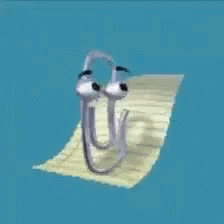 LDA

## Teste do Modelo 1

In [133]:
# Passar dados para "arrays"
import numpy as np

X_train_LDA = np.array(X_train)
y_train_LDA = np.array(y_train)

In [134]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_predict

lda = LinearDiscriminantAnalysis()

lda.fit(X_train, y_train)
y_pred = cross_val_predict(lda, X_train_LDA, y_train_LDA, cv =5)
lda.get_params(deep=True)

{'covariance_estimator': None,
 'n_components': None,
 'priors': None,
 'shrinkage': None,
 'solver': 'svd',
 'store_covariance': False,
 'tol': 0.0001}

In [135]:
# Ver resultado
from sklearn.metrics import accuracy_score

accuracy_LDA = accuracy_score(y_train_LDA, y_pred)

print(f" A acurácia do modelo LDA foi de {accuracy_LDA*100:.2f}%")

 A acurácia do modelo LDA foi de 80.62%


# 3️⃣ 🍕 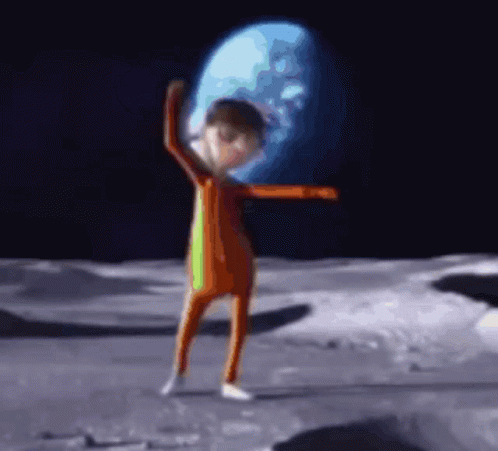 SUPPORT VECTOR MACHINE

In [136]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_train, y_train, test_size=0.3, random_state=42)


## Teste do Modelo 2

In [137]:
# Instanciar o modelo SVM
svm = SVC(
    kernel='rbf',  # Kernel radial (padrão). Outras opções: 'linear', 'poly', 'sigmoid'
    C=1.0,         # Parâmetro de regularização
    gamma='scale'  # Define como a influência de cada ponto é calculada
)

In [138]:
svm.fit(X_train_svm, y_train_svm)

SVC()

In [139]:
y_pred_svm = svm.predict(X_test_svm)

In [140]:
from sklearn.metrics import accuracy_score

accuracy_score_svm = accuracy_score(y_test_svm, y_pred_svm)
print(f" A acuracia do Modelo de SVM foi de {accuracy_score_svm*100:.2f}%")

 A acuracia do Modelo de SVM foi de 82.34%


# 4️⃣ 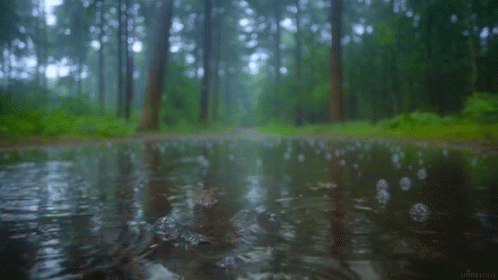 🎄 Random Forest

In [141]:
X_train_rf = X_train
y_train_rf = y_train

## Teste do Modelo 3

In [142]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

In [143]:
# Testar o A melhor profundidade pro modelo
maximum = 0
for i in range(1,40):
    rf = RandomForestClassifier(max_depth = i, random_state=0)
    rf.fit(X_train, y_train)
    accuracy_rf = rf.score(X_train_rf, y_train_rf, sample_weight=None)
    print(f"para a profunidade {i} a acuracia foi de {accuracy_rf*100:.2f}%")
    if maximum < accuracy_rf:
        maximum = i
print(f"o melhor numero de profunidade foi de {i}")
        
    
    

para a profunidade 1 a acuracia foi de 76.41%
para a profunidade 2 a acuracia foi de 79.44%
para a profunidade 3 a acuracia foi de 80.65%
para a profunidade 4 a acuracia foi de 82.40%
para a profunidade 5 a acuracia foi de 83.26%
para a profunidade 6 a acuracia foi de 83.49%
para a profunidade 7 a acuracia foi de 83.99%
para a profunidade 8 a acuracia foi de 84.21%
para a profunidade 9 a acuracia foi de 84.62%
para a profunidade 10 a acuracia foi de 84.83%
para a profunidade 11 a acuracia foi de 85.11%
para a profunidade 12 a acuracia foi de 85.30%
para a profunidade 13 a acuracia foi de 85.63%
para a profunidade 14 a acuracia foi de 85.94%
para a profunidade 15 a acuracia foi de 86.29%
para a profunidade 16 a acuracia foi de 86.78%
para a profunidade 17 a acuracia foi de 87.18%
para a profunidade 18 a acuracia foi de 87.70%
para a profunidade 19 a acuracia foi de 88.12%
para a profunidade 20 a acuracia foi de 88.55%
para a profunidade 21 a acuracia foi de 88.80%
para a profunidade 22 

não houve diferença a partir do 27

In [144]:
from sklearn.ensemble import RandomForestClassifier
rff = RandomForestClassifier(max_depth = 27, random_state=0)
rff.fit(X_train, y_train)
accuracy_rf = rff.score(X_train_rf, y_train_rf, sample_weight=None)
print(f"A acuracia do Modelo de Florestas Aleatorias foi de {accuracy_rf*100:.2f}%")

A acuracia do Modelo de Florestas Aleatorias foi de 89.23%


# 5️⃣ 🧠 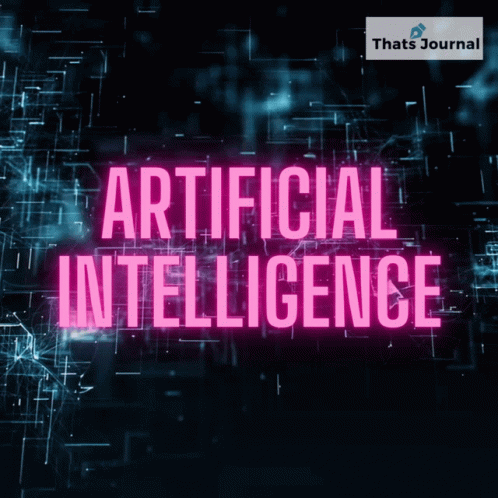 Rede Neural

In [145]:
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

In [146]:
X_train_rn, X_test_rn, y_train_rn, y_test_rn = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

## Teste do Modelo 4

In [147]:
dictionary = {"hidden_layer_sizes" : [(8,8), (8,16,8), (8,16,16,8,), (64,128,128,64), (16, 8), (8, 16, 32, 16, 8), (8, 16, 32, 32, 16, 8)],
             "max_iter" : [15]}

from sklearn.model_selection import GridSearchCV

FANN = GridSearchCV(MLPClassifier(), dictionary, cv=5, scoring="accuracy")
FANN.fit(X_train_rn, y_train_rn)

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py

GridSearchCV(cv=5, estimator=MLPClassifier(),
             param_grid={'hidden_layer_sizes': [(8, 8), (8, 16, 8),
                                                (8, 16, 16, 8),
                                                (64, 128, 128, 64), (16, 8),
                                                (8, 16, 32, 16, 8),
                                                (8, 16, 32, 32, 16, 8)],
                         'max_iter': [15]},
             scoring='accuracy')

In [148]:
best_layer = FANN.best_params_["hidden_layer_sizes"]
best_acuracy = FANN.best_score_
print(f"O melhor modelo foi o {best_layer}, obtendo uma acuracia de {best_acuracy*100:.2f}%")

O melhor modelo foi o (64, 128, 128, 64), obtendo uma acuracia de 82.41%


# Compração entre os MODELOS

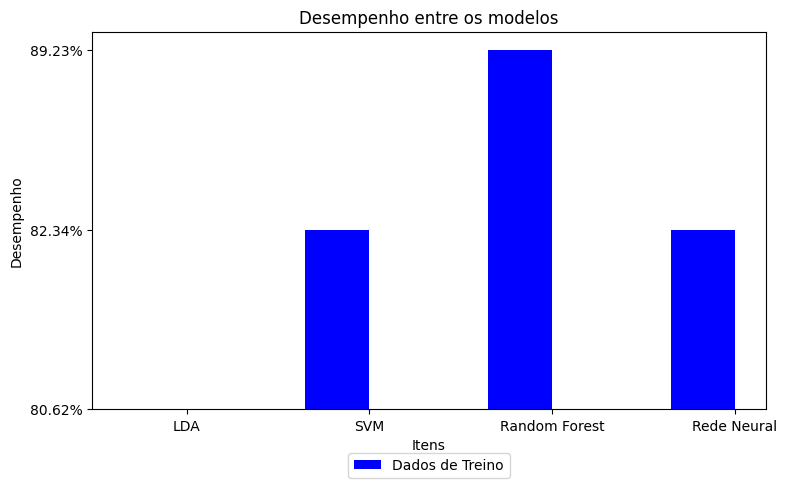

In [149]:
import numpy as np
import matplotlib.pyplot as plt

# Dados de exemplo
items = ['LDA', 'SVM', 'Random Forest', 'Rede Neural']
metrics1 = ['80.62%', '82.34%', '89.23%', '82.34%' ]

# Configuração do gráfico
x = np.arange(len(items))  # Posições das barras
width = 0.35  # Largura das barras

fig, ax = plt.subplots(figsize=(8, 5))

# Criando as barras
bars1 = ax.bar(x - width/2, metrics1, width, label='Dados de Treino', color='blue')


# Adicionando informações ao gráfico
ax.set_xlabel('Itens')
ax.set_ylabel('Desempenho')
ax.set_title('Desempenho entre os modelos')
ax.set_xticks(x)
ax.set_xticklabels(items)
ax.legend()
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=2)

# Exibindo o gráfico
plt.tight_layout()
plt.show()

### O melhor modelo foi o Random Forest e ele será enviado para a competição

# Envio do modelo para competição

In [150]:
import pandas as pd
import numpy as np

# Dados de Treino

X_train_final = X_train
Y_train_final = y_train

## Treinamento do Modelo para competição

In [151]:
from sklearn.ensemble import RandomForestClassifier
rfff = RandomForestClassifier(max_depth = 27, random_state=0)
rfff.fit(X_train, y_train)


RandomForestClassifier(max_depth=27, random_state=0)

In [152]:
output = rfff.predict(test)

output

array(['0', '1', '0', ..., '0', '0', '1'], dtype=object)

In [153]:
predictions = pd.DataFrame(({'Id':test_ids, 'income':output}))

In [154]:
predictions['income'] = predictions['income'].apply(lambda x: '<=50K' if x == '0' else '>50K')

predictions

,Id,income
0,0,<=50K
1,1,>50K
2,2,<=50K
3,3,<=50K
4,4,>50K
...,...,...
16275,16275,<=50K
16276,16276,<=50K
16277,16277,<=50K
16278,16278,<=50K


### Envio para competição

In [155]:
predictions.to_csv('submission.csv', index = False)